In [3]:
!pip install image-quality


In [9]:
!pip install tensorflow_hub

^C


  Obtaining dependency information for tensorflow_hub from https://files.pythonhosted.org/packages/e5/50/00dba77925bf2a0a1e45d7bcf8a69a1d2534fb4bb277d9010bd148d2235e/tensorflow_hub-0.16.1-py2.py3-none-any.whl.metadata
  Obtaining dependency information for tf-keras>=2.14.1 from https://files.pythonhosted.org/packages/75/aa/cf09f8956d4f276f655b13674e15d8d6015fd832f9689aa9ff2a515781ab/tf_keras-2.16.0-py3-none-any.whl.metadata
  Obtaining dependency information for tensorflow<2.17,>=2.16 from https://files.pythonhosted.org/packages/e2/46/a26598fab7da99dbe3a564f90cb4bba8de9ceb8943ff9180cd9789b5f6ea/tensorflow-2.16.1-cp310-cp310-win_amd64.whl.metadata
  Obtaining dependency information for tensorflow-intel==2.16.1 from https://files.pythonhosted.org/packages/f1/32/05a56ab12d5601b5399e64b8f875362fb59c99218a5e74a99364a58516be/tensorflow_intel-2.16.1-cp310-cp310-win_amd64.whl.metadata
  Obtaining dependency information for flatbuffers>=23.5.26 from https://files.pythonhosted.org/packages/41/f0

  Obtaining dependency information for tensorflow_hub from https://files.pythonhosted.org/packages/e5/50/00dba77925bf2a0a1e45d7bcf8a69a1d2534fb4bb277d9010bd148d2235e/tensorflow_hub-0.16.1-py2.py3-none-any.whl.metadata
  Using cached tensorflow_hub-0.16.1-py2.py3-none-any.whl.metadata (1.3 kB)
  Obtaining dependency information for tf-keras>=2.14.1 from https://files.pythonhosted.org/packages/75/aa/cf09f8956d4f276f655b13674e15d8d6015fd832f9689aa9ff2a515781ab/tf_keras-2.16.0-py3-none-any.whl.metadata
  Using cached tf_keras-2.16.0-py3-none-any.whl.metadata (1.6 kB)
  Obtaining dependency information for tensorflow<2.17,>=2.16 from https://files.pythonhosted.org/packages/e2/46/a26598fab7da99dbe3a564f90cb4bba8de9ceb8943ff9180cd9789b5f6ea/tensorflow-2.16.1-cp310-cp310-win_amd64.whl.metadata
  Using cached tensorflow-2.16.1-cp310-cp310-win_amd64.whl.metadata (3.5 kB)
  Obtaining dependency information for tensorflow-intel==2.16.1 from https://files.pythonhosted.org/packages/f1/32/05a56ab12d5

  Obtaining dependency information for tensorflow_hub from https://files.pythonhosted.org/packages/e5/50/00dba77925bf2a0a1e45d7bcf8a69a1d2534fb4bb277d9010bd148d2235e/tensorflow_hub-0.16.1-py2.py3-none-any.whl.metadata
  Using cached tensorflow_hub-0.16.1-py2.py3-none-any.whl.metadata (1.3 kB)
  Obtaining dependency information for tf-keras>=2.14.1 from https://files.pythonhosted.org/packages/75/aa/cf09f8956d4f276f655b13674e15d8d6015fd832f9689aa9ff2a515781ab/tf_keras-2.16.0-py3-none-any.whl.metadata
  Using cached tf_keras-2.16.0-py3-none-any.whl.metadata (1.6 kB)
  Obtaining dependency information for tensorflow<2.17,>=2.16 from https://files.pythonhosted.org/packages/e2/46/a26598fab7da99dbe3a564f90cb4bba8de9ceb8943ff9180cd9789b5f6ea/tensorflow-2.16.1-cp310-cp310-win_amd64.whl.metadata
  Using cached tensorflow-2.16.1-cp310-cp310-win_amd64.whl.metadata (3.5 kB)
  Obtaining dependency information for tensorflow-intel==2.16.1 from https://files.pythonhosted.org/packages/f1/32/05a56ab12d5

In [1]:
import os
import time
from PIL import Image
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
os.environ["TFHUB_DOWNLOAD_PROGRESS"] = "True"

In [2]:

SAVED_MODEL_PATH = "https://tfhub.dev/captain-pool/esrgan-tf2/1"

In [11]:

# img=plt.imread("00015.jpg")
# plt.imshow(img)

In [3]:
def preprocess_image(image_path):
  """ Loads image from path and preprocesses to make it model ready
      Args:
        image_path: Path to the image file
  """
  hr_image = tf.image.decode_image(tf.io.read_file(image_path))
  # If PNG, remove the alpha channel. The model only supports
  # images with 3 color channels.
  if hr_image.shape[-1] == 4:
    hr_image = hr_image[...,:-1]
  hr_size = (tf.convert_to_tensor(hr_image.shape[:-1]) // 4) * 4
  hr_image = tf.image.crop_to_bounding_box(hr_image, 0, 0, hr_size[0], hr_size[1])
  hr_image = tf.cast(hr_image, tf.float32)
  return tf.expand_dims(hr_image, 0)

def save_image(image, filename):
  """
    Saves unscaled Tensor Images.
    Args:
      image: 3D image tensor. [height, width, channels]
      filename: Name of the file to save.
  """
  if not isinstance(image, Image.Image):
    image = tf.clip_by_value(image, 0, 255)
    image = Image.fromarray(tf.cast(image, tf.uint8).numpy())
  image.save("%s.jpg" % filename)
  print("Saved as %s.jpg" % filename)

In [4]:
%matplotlib inline
def plot_image(image, title=""):
  """
    Plots images from image tensors.
    Args:
      image: 3D image tensor. [height, width, channels].
      title: Title to display in the plot.
  """
  image = np.asarray(image)
  image = tf.clip_by_value(image, 0, 255)
  image = Image.fromarray(tf.cast(image, tf.uint8).numpy())
  plt.imshow(image)
  plt.axis("off")
  plt.title(title)

In [5]:
hr_image = preprocess_image("00015.jpg")

Saved as Original Image.jpg


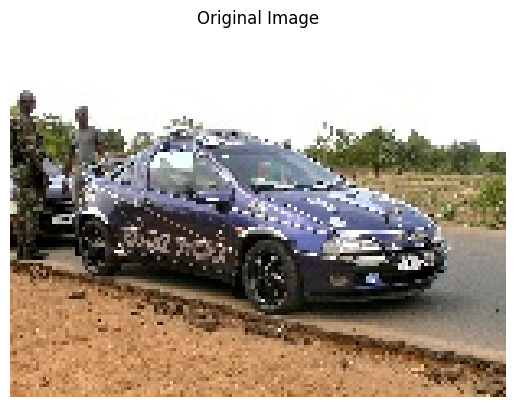

In [6]:
# Plotting Original Resolution image
plot_image(tf.squeeze(hr_image), title="Original Image")
save_image(tf.squeeze(hr_image), filename="Original Image")

In [7]:
model = hub.load(SAVED_MODEL_PATH)

In [9]:
start = time.time()
fake_image = model(hr_image)
fake_image = tf.squeeze(fake_image)
print("Time Taken: %f" % (time.time() - start))

Time Taken: 0.734138


Saved as Super Resolution.jpg


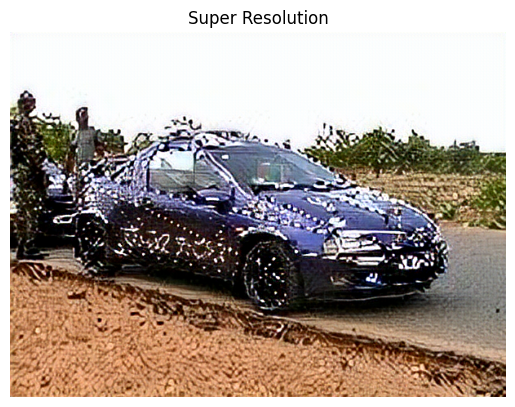

In [10]:
# Plotting Super Resolution Image
plot_image(tf.squeeze(fake_image), title="Super Resolution")
save_image(tf.squeeze(fake_image), filename="Super Resolution")

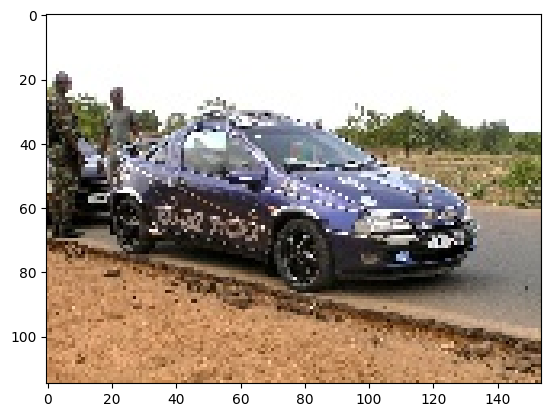

In [11]:
import cv2
a=cv2.cvtColor(cv2.imread("00015.jpg"),cv2.COLOR_BGR2RGB) 
plt.imshow(a)

In [13]:
hr_image = preprocess_image("baboon.jpeg")

Saved as Original Image.jpg


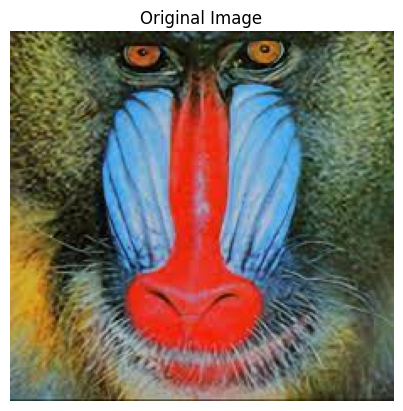

In [14]:
# Plotting Original Resolution image
plot_image(tf.squeeze(hr_image), title="Original Image")
save_image(tf.squeeze(hr_image), filename="Original Image")

In [15]:
start = time.time()
fake_image = model(hr_image)
fake_image = tf.squeeze(fake_image)
print("Time Taken: %f" % (time.time() - start))

Time Taken: 2.898769


In [16]:
model = hub.load(SAVED_MODEL_PATH)

Saved as Super Resolution.jpg


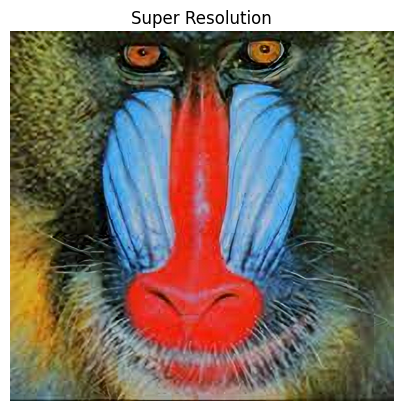

In [17]:
# Plotting Super Resolution Image
plot_image(tf.squeeze(fake_image), title="Super Resolution") 
save_image(tf.squeeze(fake_image), filename="Super Resolution")

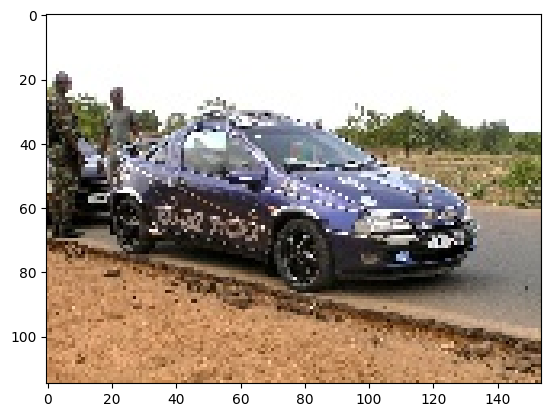

In [18]:
import cv2
a=cv2.cvtColor(cv2.imread("00015.jpg"),cv2.COLOR_BGR2RGB) 
plt.imshow(a) 